<a href="https://colab.research.google.com/github/MinnDdu/deep_learning_practice/blob/main/GAN_practice.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import os
os.environ['KAGGLE_CONFIG_DIR'] = "/content/" 
# kaggle.json 자료 위치
# 새로운 런타임마다 넣어줘야함!
# 런타임 유형 GPU로 할 것

!kaggle datasets download -d jessicali9530/celeba-dataset

100% 1.33G/1.33G [00:07<00:00, 269MB/s]
100% 1.33G/1.33G [00:07<00:00, 194MB/s]


In [2]:
!unzip -q celeba-dataset.zip -d .

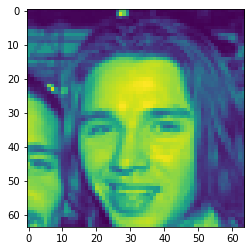

(50000, 64, 64)


In [8]:
import os
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
# python image library - 이미지를 숫자로 변환하기 쉬움

# Image.open('이미지경로') -> 행렬화된 이미지
filelist = os.listdir('/content/img_align_celeba/img_align_celeba')

images = []

for i in range(len(filelist[0:50000])):
    matrix = Image.open('/content/img_align_celeba/img_align_celeba/' + filelist[i]).crop((20, 30, 160, 180)).convert('L').resize((64, 64))
    # 이미지 여백 잘라주기 - crop(), 이미지 흑백화 - convert('L)
    # 이미지 약간 전처리 해주고 넣어주기 - 트레이닝 시간 절약 위해 이미지 사이즈 64x64로 조절하기 (원래사이즈는 178x218) - resize()
    # 
    images.append(np.array(matrix))

plt.imshow(images[1])
plt.show()

images = np.array(images) # images의 shape가 궁금해 넘파이 어레이로 전환
print(images.shape) # 보이는건 노란색 초록색등이 보이면 흑백사진 맞음, 진짜 흑백으로 보려면 따로 처리필요


In [9]:
# 이미지 전처리 - 이미지들의 색깔을 255로 나누기
np.divide(images, 255)
# 이것들을 convolution layer에 넣어주려면 shape가 4차원 (4-dim) 이어야함 EX) (50000, 64, 64, 3) -> 컬러이미지 (rgb 3개)
# 그런데 현재 흑백이미지는 (50000, 64, 64)
# reshape로 차원 늘리기
images = images.reshape(50000, 64, 64, 1)
print(images.shape)

(50000, 64, 64, 1)


# **Model Making**

In [14]:
# generator / discriminator / GAN 모델 만들기
# 1. Discriminator
# Input - image
# output - 확률
import tensorflow as tf

discriminator = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(64, (3, 3), strides=(2, 2), padding='same', input_shape=[64, 64, 1]),
    tf.keras.layers.LeakyReLU(alpha='0.2'), # activation함수 역할을 함 (gan에서는 LeakyReLU가 효과가 좋을수도)
    # 그냥 activation func인 ReLU는 음수를 모두 0으로... - LeakyReLU는 음수에 작은 숫자를 곱해줌(alpha 값)
    tf.keras.layers.Dropout(0.4),
    tf.keras.layers.Conv2D(64, (3, 3), strides=(2, 2), padding='same'),
    tf.keras.layers.LeakyReLU(alpha='0.2'),
    tf.keras.layers.Dropout(0.4),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(1, activation='sigmoid')
])


# 2. Generator
# input - random number
# output - fake image (matrix)

noise_shape = 100

# 즉 generator 는 임의의 숫자를 넣으면 우리가 설정한 (64, 64, 1)의 shape를 가진 가짜 사람 이미지를 만들어줘야함
# (100) -> (64, 64, 1)로 shape를 변환해주는 generator 모델을 만들어야함 -> 어떻게..?
# 1) 단순 Dense레이어로 노드 늘리고 reshpae -> Ex) Dense(100) -> Dense(400) -> Dense(64*64) -> Reshape((64, 64, 1)) ...
# 근데 이 방법은 효과가 별로임 -> 레이어 간의 연관성이 떨어짐
# 2) Convolution layer 이용 -> Conv2D 레이어는 특성추출 (feature extraction)을 함
# 이 특성추출을 역으로 한다고 생각하면 편함 -> 원래 특성추출을 하면 이미지 작아질수 있음
# 반대로 특성추출을 하면서 이미지 사이즈 키우기! -> 여러 방법존재 -> UpSampleing2D layer / Conv2DTranspose layer

generator = tf.keras.models.Sequential([
  tf.keras.layers.Dense(4 * 4 * 256, input_shape=(100,) ), # 노드수는 임의로 설정 가능 이미지스럽게 해둔 것
  tf.keras.layers.Reshape((4, 4, 256)),
  tf.keras.layers.Conv2DTranspose(256, 3, strides=2, padding='same'),
  tf.keras.layers.LeakyReLU(alpha=0.2),
  tf.keras.layers.BatchNormalization(), # 결과를 좋게해주기 위한 레이어
  tf.keras.layers.Conv2DTranspose(128, 3, strides=2, padding='same'),
  tf.keras.layers.LeakyReLU(alpha=0.2),
  tf.keras.layers.BatchNormalization(),
  tf.keras.layers.Conv2DTranspose(64, 3, strides=2, padding='same'),
  tf.keras.layers.LeakyReLU(alpha=0.2),
  tf.keras.layers.BatchNormalization(),
  tf.keras.layers.Conv2DTranspose(1, 3, strides=2, padding='same', activation='sigmoid')
])

generator.summary() # Conv2DTranspose 레이어를 거칠수록 사이즈가 거치는 모습을 볼 수 있음

# 3. GAN model

GAN = tf.keras.models.Sequential([generator, discriminator]) # Sequential 안에 레이어 뿐만 아니라 모델(레이어 여러개)도 가능
# 트레이닝 위해 컴파일 부터
discriminator.compile(optimizer='adam', loss='binary_crossentropy')

# generaotr 컴파일? -> 해야함! 그런데 따로 generator만 컴파일 해주는 것이 아님
# GAN 작동을 생각해보면 우선 discriminator 트레이닝 후에 generator 트레이닝을 함! 그런데 generator는 GAN 전체를 사용해서 트레이닝 한다 하였음
# 즉, GAN을 컴파일 해줌
# 근데 GAN을 이용해 generator를 트레이닝 할때 discriminator는 학습시키면 안됨!!!!! discriminator는 구분 역할만 해야함 
# (discriminator.trainable = False)
discriminator.trainable = False
GAN.compile(optimizer='adam', loss='binary_crossentropy')


Model: "sequential_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_9 (Dense)             (None, 4096)              413696    
                                                                 
 reshape_4 (Reshape)         (None, 4, 4, 256)         0         
                                                                 
 conv2d_transpose_16 (Conv2D  (None, 8, 8, 256)        590080    
 Transpose)                                                      
                                                                 
 leaky_re_lu_22 (LeakyReLU)  (None, 8, 8, 256)         0         
                                                                 
 batch_normalization_12 (Bat  (None, 8, 8, 256)        1024      
 chNormalization)                                                
                                                                 
 conv2d_transpose_17 (Conv2D  (None, 16, 16, 128)    

In [23]:
# GAN test

def predict_pics():
    random_num = np.random.uniform(-1, 1, size=(8, 100)) # uniform - 범위중에서 숫자를 균일하게 뽑아주세요
    pred = generator.predict(random_num) # 랜덤숫자(인풋) 넣기
    print(pred.shape)

    # 생성된 이미지 8개 미리보기
    for i in range(8):
        plt.subplot(2, 5, i+1)
        plt.imshow(pred[i].reshape(64,64), cmap='gray') # 컬러 이미지는 (64, 64, 3)
        plt.axis('off')
        plt.tight_layout()
        plt.show() # 아직 generator 트레이닝 안해서 사람얼굴같은 이미지 안나옴



# **Model Training**



epoch: 0
batch_number: 0
1/1 [==============================] - 0s 22ms/step
(8, 64, 64, 1)


/usr/local/lib/python3.8/dist-packages/tensorflow/python/data/ops/structured_function.py:264: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


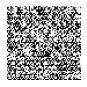

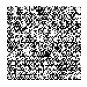

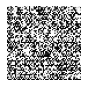

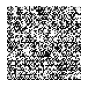

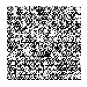

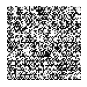

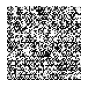

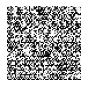

4/4 [==============================] - 0s 10ms/step
batch_number: 100
1/1 [==============================] - 0s 20ms/step
(8, 64, 64, 1)


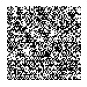

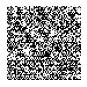

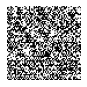

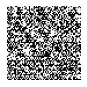

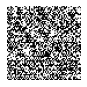

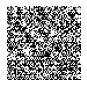

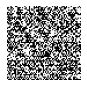

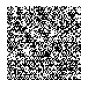

4/4 [==============================] - 0s 10ms/step
batch_number: 200
1/1 [==============================] - 0s 20ms/step
(8, 64, 64, 1)


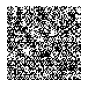

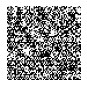

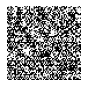

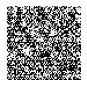

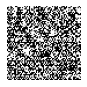

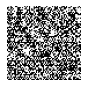

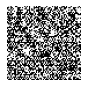

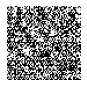

4/4 [==============================] - 0s 10ms/step
batch_number: 300
1/1 [==============================] - 0s 19ms/step
(8, 64, 64, 1)


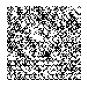

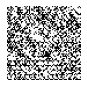

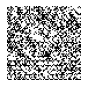

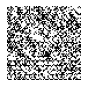

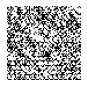

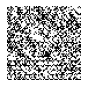

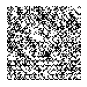

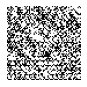

4/4 [==============================] - 0s 10ms/step
epoch 0 loss - discriminator: 0.00020569426123984158 / GAN: 8.592353820800781
epoch: 1
batch_number: 0
1/1 [==============================] - 0s 22ms/step
(8, 64, 64, 1)


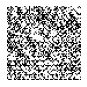

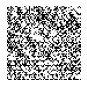

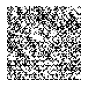

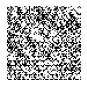

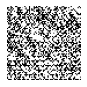

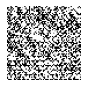

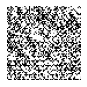

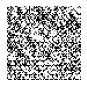

4/4 [==============================] - 0s 10ms/step
batch_number: 100
1/1 [==============================] - 0s 25ms/step
(8, 64, 64, 1)


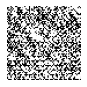

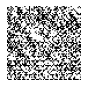

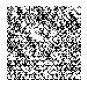

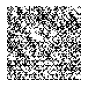

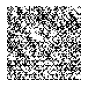

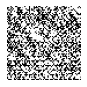

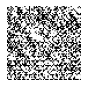

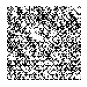

4/4 [==============================] - 0s 10ms/step
batch_number: 200
1/1 [==============================] - 0s 19ms/step
(8, 64, 64, 1)


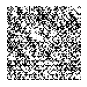

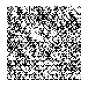

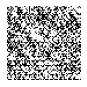

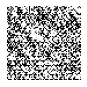

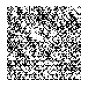

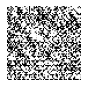

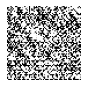

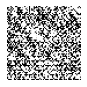

4/4 [==============================] - 0s 10ms/step
batch_number: 300
1/1 [==============================] - 0s 21ms/step
(8, 64, 64, 1)


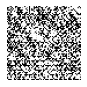

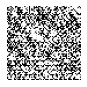

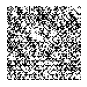

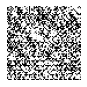

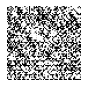

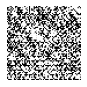

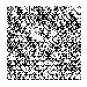

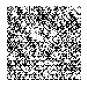

4/4 [==============================] - 0s 12ms/step
epoch 1 loss - discriminator: 3.960384856327437e-05 / GAN: 10.217876434326172
epoch: 2
batch_number: 0
1/1 [==============================] - 0s 24ms/step
(8, 64, 64, 1)


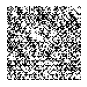

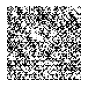

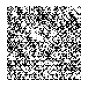

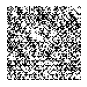

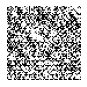

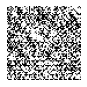

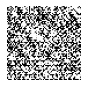

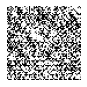

4/4 [==============================] - 0s 11ms/step
batch_number: 100
1/1 [==============================] - 0s 20ms/step
(8, 64, 64, 1)


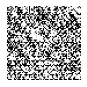

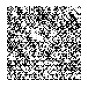

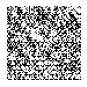

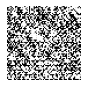

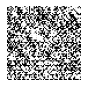

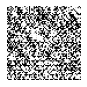

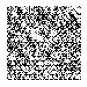

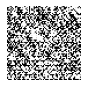

4/4 [==============================] - 0s 11ms/step
batch_number: 200
1/1 [==============================] - 0s 20ms/step
(8, 64, 64, 1)


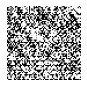

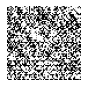

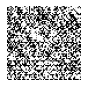

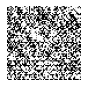

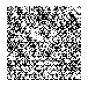

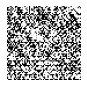

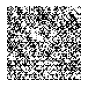

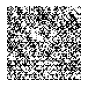

4/4 [==============================] - 0s 11ms/step
batch_number: 300
1/1 [==============================] - 0s 20ms/step
(8, 64, 64, 1)


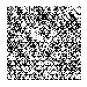

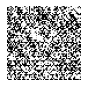

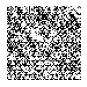

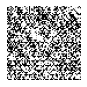

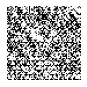

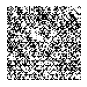

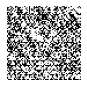

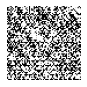

4/4 [==============================] - 0s 11ms/step
epoch 2 loss - discriminator: 1.635748594708275e-05 / GAN: 11.039421081542969
epoch: 3
batch_number: 0
1/1 [==============================] - 0s 19ms/step
(8, 64, 64, 1)


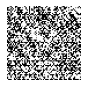

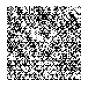

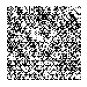

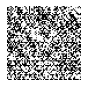

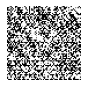

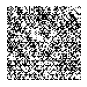

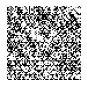

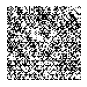

4/4 [==============================] - 0s 11ms/step
batch_number: 100
1/1 [==============================] - 0s 20ms/step
(8, 64, 64, 1)


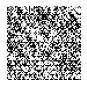

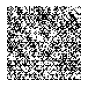

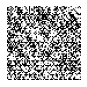

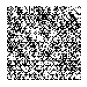

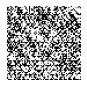

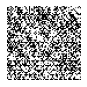

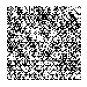

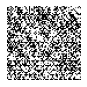

4/4 [==============================] - 0s 12ms/step
batch_number: 200
1/1 [==============================] - 0s 22ms/step
(8, 64, 64, 1)


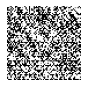

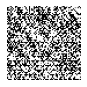

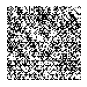

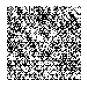

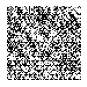

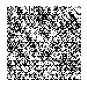

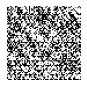

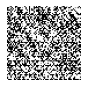

4/4 [==============================] - 0s 11ms/step
batch_number: 300
1/1 [==============================] - 0s 24ms/step
(8, 64, 64, 1)


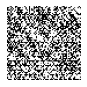

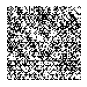

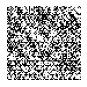

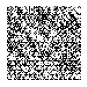

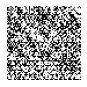

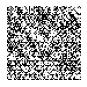

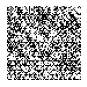

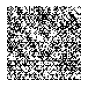

4/4 [==============================] - 0s 13ms/step
epoch 3 loss - discriminator: 9.228768249158747e-06 / GAN: 11.736469268798828
epoch: 4
batch_number: 0
1/1 [==============================] - 0s 24ms/step
(8, 64, 64, 1)


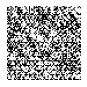

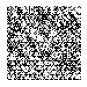

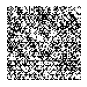

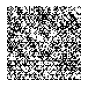

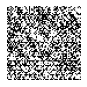

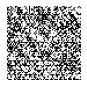

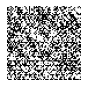

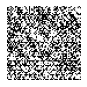

4/4 [==============================] - 0s 12ms/step
batch_number: 100
1/1 [==============================] - 0s 19ms/step
(8, 64, 64, 1)


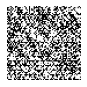

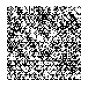

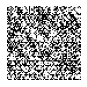

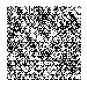

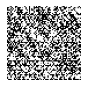

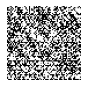

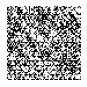

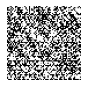

4/4 [==============================] - 0s 12ms/step
batch_number: 200
1/1 [==============================] - 0s 31ms/step
(8, 64, 64, 1)


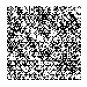

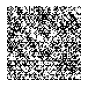

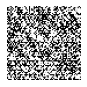

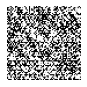

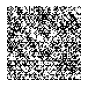

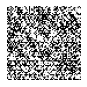

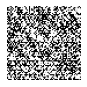

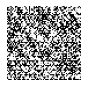

4/4 [==============================] - 0s 12ms/step
batch_number: 300
1/1 [==============================] - 0s 19ms/step
(8, 64, 64, 1)


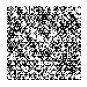

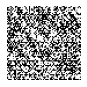

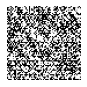

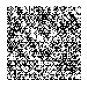

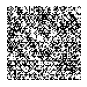

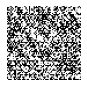

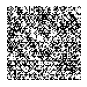

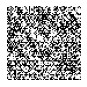

4/4 [==============================] - 0s 13ms/step
epoch 4 loss - discriminator: 5.688084002031246e-06 / GAN: 12.17495059967041
epoch: 5
batch_number: 0
1/1 [==============================] - 0s 25ms/step
(8, 64, 64, 1)


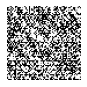

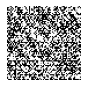

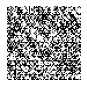

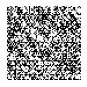

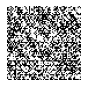

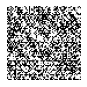

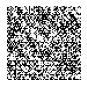

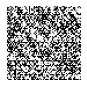

4/4 [==============================] - 0s 12ms/step
batch_number: 100
1/1 [==============================] - 0s 23ms/step
(8, 64, 64, 1)


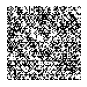

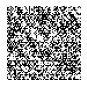

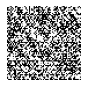

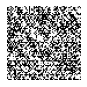

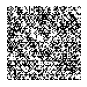

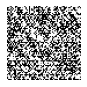

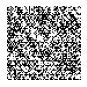

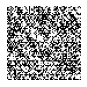

4/4 [==============================] - 0s 12ms/step
batch_number: 200
1/1 [==============================] - 0s 20ms/step
(8, 64, 64, 1)


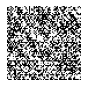

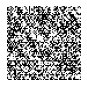

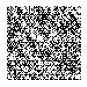

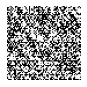

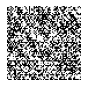

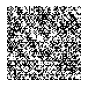

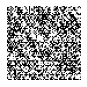

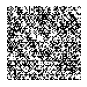

4/4 [==============================] - 0s 15ms/step
batch_number: 300
1/1 [==============================] - 0s 32ms/step
(8, 64, 64, 1)


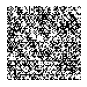

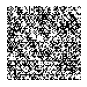

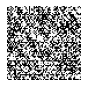

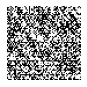

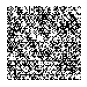

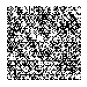

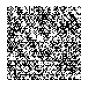

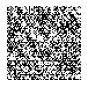

4/4 [==============================] - 0s 15ms/step
epoch 5 loss - discriminator: 3.36461766892171e-06 / GAN: 12.667594909667969
epoch: 6
batch_number: 0
1/1 [==============================] - 0s 22ms/step
(8, 64, 64, 1)


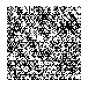

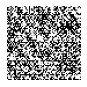

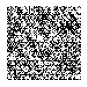

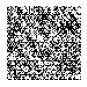

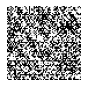

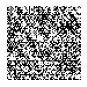

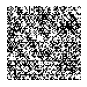

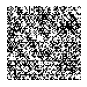

4/4 [==============================] - 0s 11ms/step
batch_number: 100
1/1 [==============================] - 0s 29ms/step
(8, 64, 64, 1)


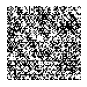

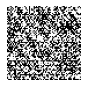

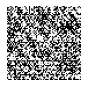

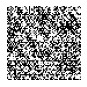

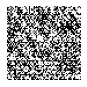

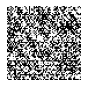

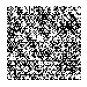

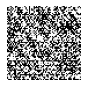

4/4 [==============================] - 0s 11ms/step
batch_number: 200
1/1 [==============================] - 0s 27ms/step
(8, 64, 64, 1)


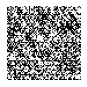

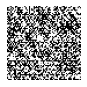

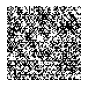

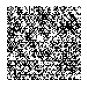

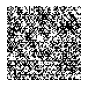

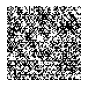

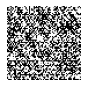

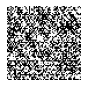

4/4 [==============================] - 0s 12ms/step
batch_number: 300
1/1 [==============================] - 0s 28ms/step
(8, 64, 64, 1)


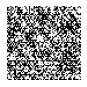

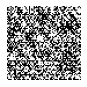

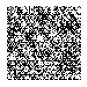

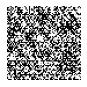

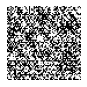

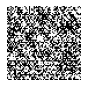

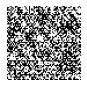

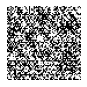

4/4 [==============================] - 0s 11ms/step
epoch 6 loss - discriminator: 2.2304002413875423e-06 / GAN: 13.144546508789062
epoch: 7
batch_number: 0
1/1 [==============================] - 0s 27ms/step
(8, 64, 64, 1)


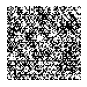

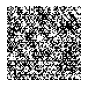

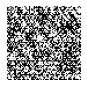

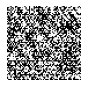

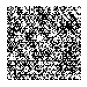

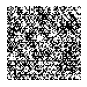

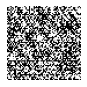

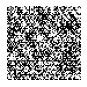

4/4 [==============================] - 0s 11ms/step
batch_number: 100
1/1 [==============================] - 0s 27ms/step
(8, 64, 64, 1)


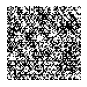

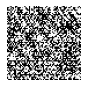

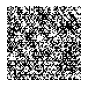

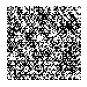

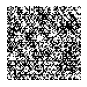

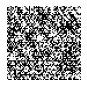

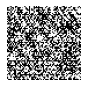

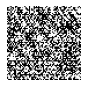

4/4 [==============================] - 0s 11ms/step
batch_number: 200
1/1 [==============================] - 0s 28ms/step
(8, 64, 64, 1)


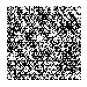

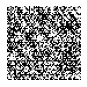

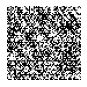

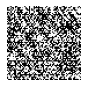

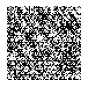

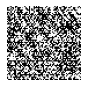

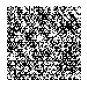

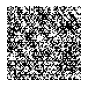

4/4 [==============================] - 0s 12ms/step
batch_number: 300
1/1 [==============================] - 0s 37ms/step
(8, 64, 64, 1)


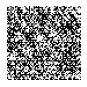

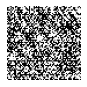

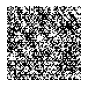

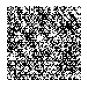

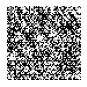

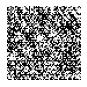

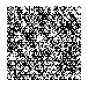

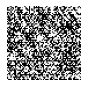

4/4 [==============================] - 0s 12ms/step
epoch 7 loss - discriminator: 1.42860062624095e-06 / GAN: 13.583974838256836
epoch: 8
batch_number: 0
1/1 [==============================] - 0s 29ms/step
(8, 64, 64, 1)


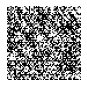

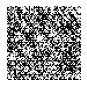

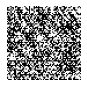

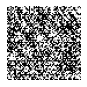

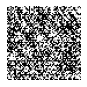

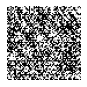

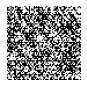

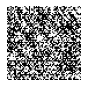

4/4 [==============================] - 0s 11ms/step
batch_number: 100
1/1 [==============================] - 0s 30ms/step
(8, 64, 64, 1)


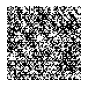

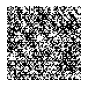

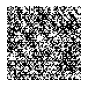

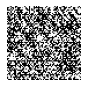

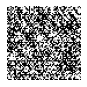

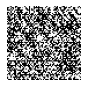

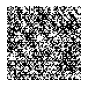

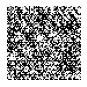

4/4 [==============================] - 0s 11ms/step
batch_number: 200
1/1 [==============================] - 0s 29ms/step
(8, 64, 64, 1)


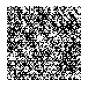

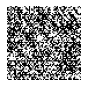

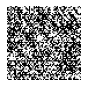

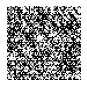

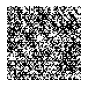

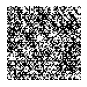

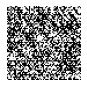

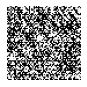

4/4 [==============================] - 0s 12ms/step
batch_number: 300
1/1 [==============================] - 0s 33ms/step
(8, 64, 64, 1)


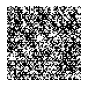

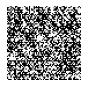

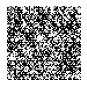

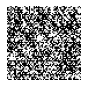

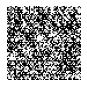

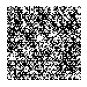

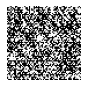

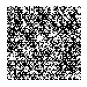

4/4 [==============================] - 0s 11ms/step
epoch 8 loss - discriminator: 9.152187772087927e-07 / GAN: 14.019243240356445
epoch: 9
batch_number: 0
1/1 [==============================] - 0s 32ms/step
(8, 64, 64, 1)


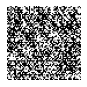

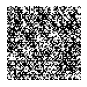

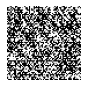

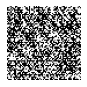

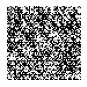

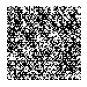

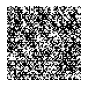

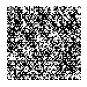

4/4 [==============================] - 0s 11ms/step
batch_number: 100
1/1 [==============================] - 0s 24ms/step
(8, 64, 64, 1)


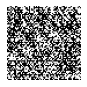

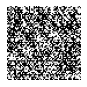

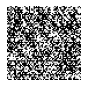

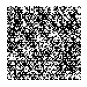

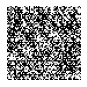

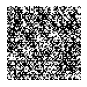

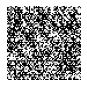

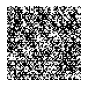

4/4 [==============================] - 0s 11ms/step
batch_number: 200
1/1 [==============================] - 0s 27ms/step
(8, 64, 64, 1)


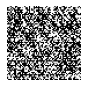

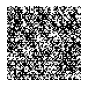

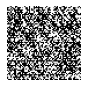

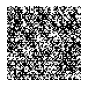

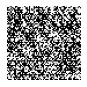

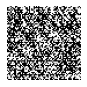

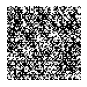

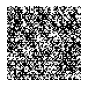

4/4 [==============================] - 0s 12ms/step
batch_number: 300
1/1 [==============================] - 0s 29ms/step
(8, 64, 64, 1)


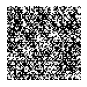

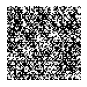

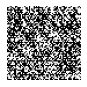

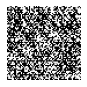

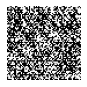

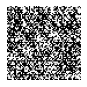

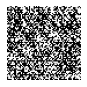

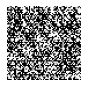

4/4 [==============================] - 0s 11ms/step
epoch 9 loss - discriminator: 5.965488867332169e-07 / GAN: 14.355001449584961
epoch: 10
batch_number: 0
1/1 [==============================] - 0s 28ms/step
(8, 64, 64, 1)


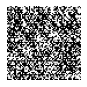

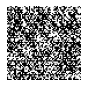

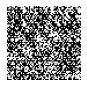

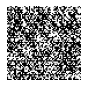

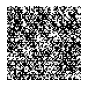

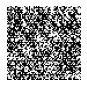

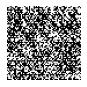

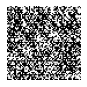

4/4 [==============================] - 0s 11ms/step
batch_number: 100
1/1 [==============================] - 0s 33ms/step
(8, 64, 64, 1)


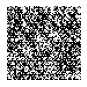

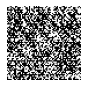

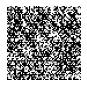

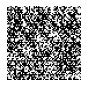

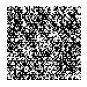

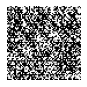

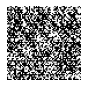

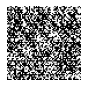

4/4 [==============================] - 0s 15ms/step
batch_number: 200
1/1 [==============================] - 0s 19ms/step
(8, 64, 64, 1)


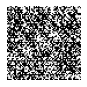

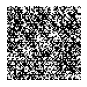

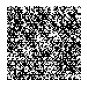

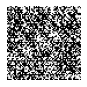

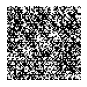

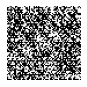

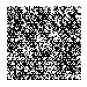

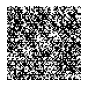

4/4 [==============================] - 0s 14ms/step
batch_number: 300
1/1 [==============================] - 0s 31ms/step
(8, 64, 64, 1)


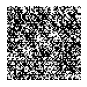

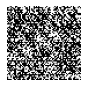

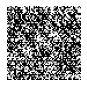

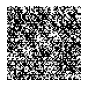

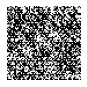

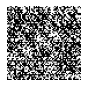

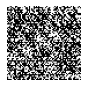

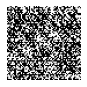

4/4 [==============================] - 0s 11ms/step
epoch 10 loss - discriminator: 4.1325782262902067e-07 / GAN: 14.784996032714844
epoch: 11
batch_number: 0
1/1 [==============================] - 0s 25ms/step
(8, 64, 64, 1)


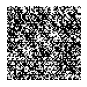

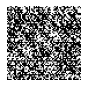

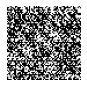

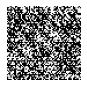

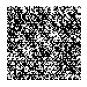

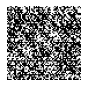

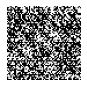

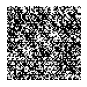

4/4 [==============================] - 0s 11ms/step
batch_number: 100
1/1 [==============================] - 0s 26ms/step
(8, 64, 64, 1)


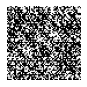

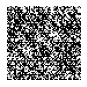

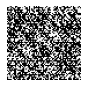

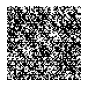

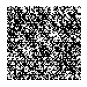

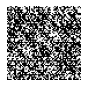

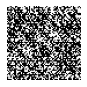

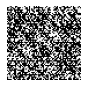

4/4 [==============================] - 0s 11ms/step
batch_number: 200
1/1 [==============================] - 0s 27ms/step
(8, 64, 64, 1)


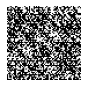

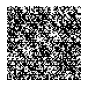

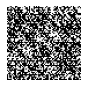

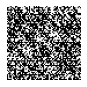

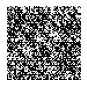

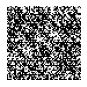

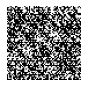

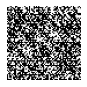

4/4 [==============================] - 0s 11ms/step
batch_number: 300
1/1 [==============================] - 0s 28ms/step
(8, 64, 64, 1)


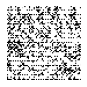

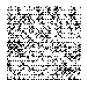

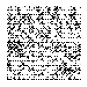

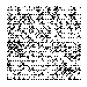

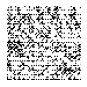

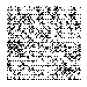

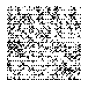

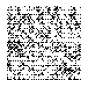

4/4 [==============================] - 0s 11ms/step
epoch 11 loss - discriminator: 1.6386190964112757e-06 / GAN: 13.467615127563477
epoch: 12
batch_number: 0
1/1 [==============================] - 0s 31ms/step
(8, 64, 64, 1)


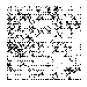

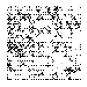

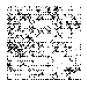

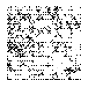

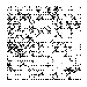

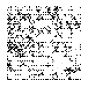

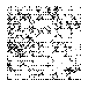

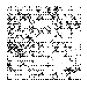

4/4 [==============================] - 0s 13ms/step
batch_number: 100
1/1 [==============================] - 0s 30ms/step
(8, 64, 64, 1)


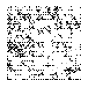

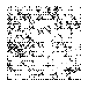

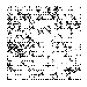

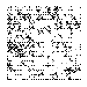

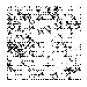

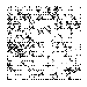

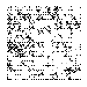

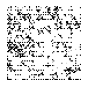

4/4 [==============================] - 0s 12ms/step
batch_number: 200
1/1 [==============================] - 0s 21ms/step
(8, 64, 64, 1)


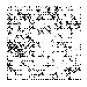

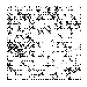

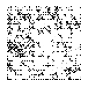

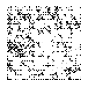

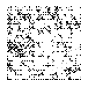

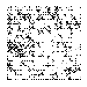

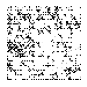

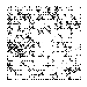

4/4 [==============================] - 0s 12ms/step
batch_number: 300
1/1 [==============================] - 0s 28ms/step
(8, 64, 64, 1)


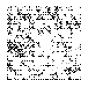

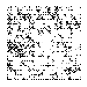

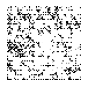

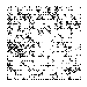

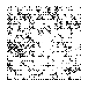

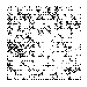

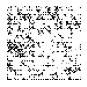

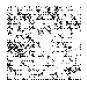

4/4 [==============================] - 0s 11ms/step
epoch 12 loss - discriminator: 2.535257976887806e-07 / GAN: 15.265727996826172
epoch: 13
batch_number: 0
1/1 [==============================] - 0s 27ms/step
(8, 64, 64, 1)


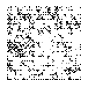

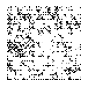

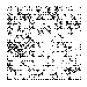

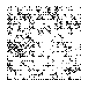

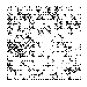

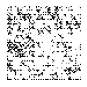

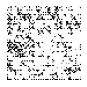

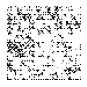

4/4 [==============================] - 0s 13ms/step
batch_number: 100
1/1 [==============================] - 0s 28ms/step
(8, 64, 64, 1)


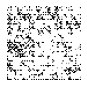

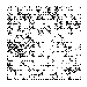

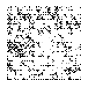

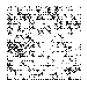

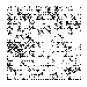

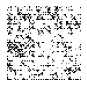

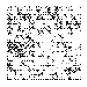

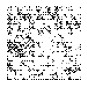

4/4 [==============================] - 0s 16ms/step
batch_number: 200
1/1 [==============================] - 0s 26ms/step
(8, 64, 64, 1)


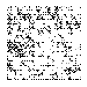

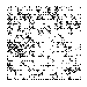

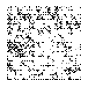

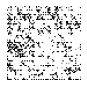

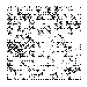

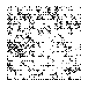

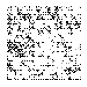

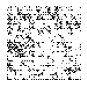

4/4 [==============================] - 0s 11ms/step
batch_number: 300
1/1 [==============================] - 0s 28ms/step
(8, 64, 64, 1)


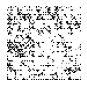

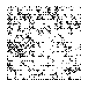

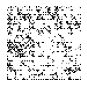

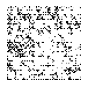

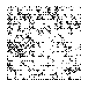

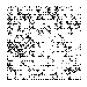

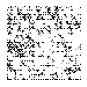

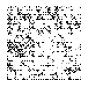

4/4 [==============================] - 0s 12ms/step
epoch 13 loss - discriminator: 1.0798412120038847e-07 / GAN: 16.163619995117188
epoch: 14
batch_number: 0
1/1 [==============================] - 0s 30ms/step
(8, 64, 64, 1)


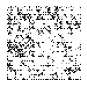

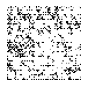

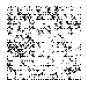

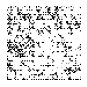

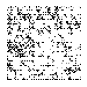

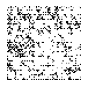

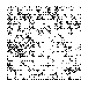

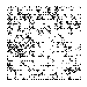

4/4 [==============================] - 0s 11ms/step
batch_number: 100
1/1 [==============================] - 0s 30ms/step
(8, 64, 64, 1)


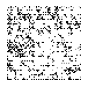

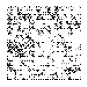

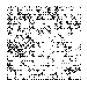

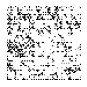

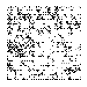

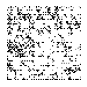

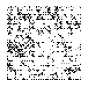

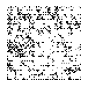

4/4 [==============================] - 0s 14ms/step
batch_number: 200
1/1 [==============================] - 0s 19ms/step
(8, 64, 64, 1)


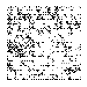

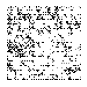

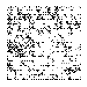

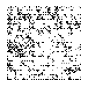

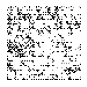

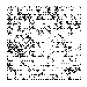

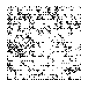

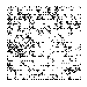

4/4 [==============================] - 0s 11ms/step
batch_number: 300
1/1 [==============================] - 0s 31ms/step
(8, 64, 64, 1)


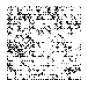

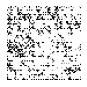

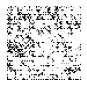

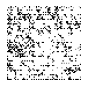

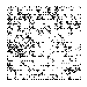

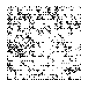

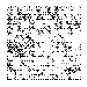

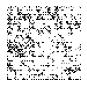

4/4 [==============================] - 0s 10ms/step
epoch 14 loss - discriminator: 6.359066162531235e-08 / GAN: 16.86553955078125
epoch: 15
batch_number: 0
1/1 [==============================] - 0s 31ms/step
(8, 64, 64, 1)


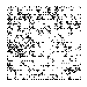

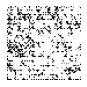

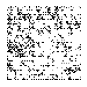

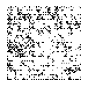

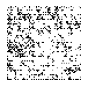

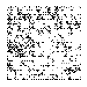

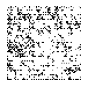

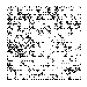

4/4 [==============================] - 0s 15ms/step
batch_number: 100
1/1 [==============================] - 0s 31ms/step
(8, 64, 64, 1)


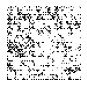

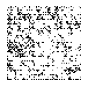

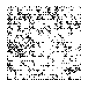

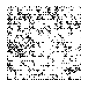

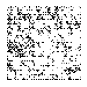

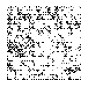

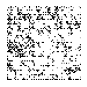

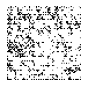

4/4 [==============================] - 0s 11ms/step
batch_number: 200
1/1 [==============================] - 0s 30ms/step
(8, 64, 64, 1)


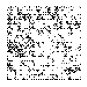

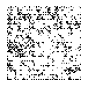

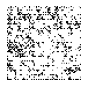

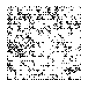

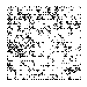

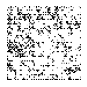

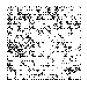

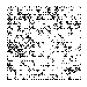

4/4 [==============================] - 0s 11ms/step
batch_number: 300
1/1 [==============================] - 0s 28ms/step
(8, 64, 64, 1)


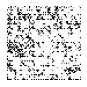

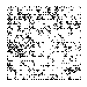

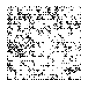

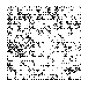

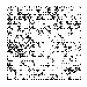

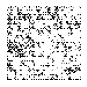

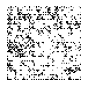

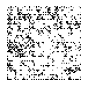

4/4 [==============================] - 0s 11ms/step
epoch 15 loss - discriminator: 3.380121427198901e-08 / GAN: 17.3514404296875
epoch: 16
batch_number: 0
1/1 [==============================] - 0s 20ms/step
(8, 64, 64, 1)


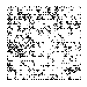

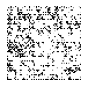

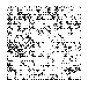

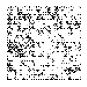

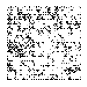

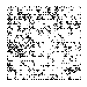

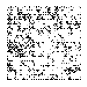

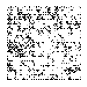

4/4 [==============================] - 0s 15ms/step
batch_number: 100
1/1 [==============================] - 0s 28ms/step
(8, 64, 64, 1)


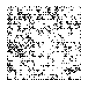

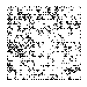

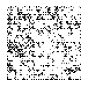

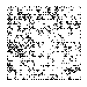

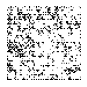

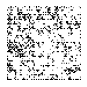

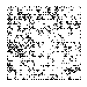

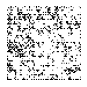

4/4 [==============================] - 0s 16ms/step
batch_number: 200
1/1 [==============================] - 0s 28ms/step
(8, 64, 64, 1)


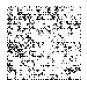

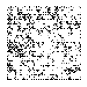

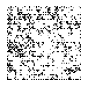

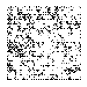

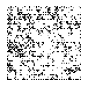

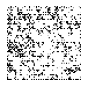

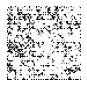

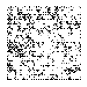

4/4 [==============================] - 0s 15ms/step
batch_number: 300
1/1 [==============================] - 0s 22ms/step
(8, 64, 64, 1)


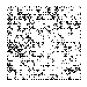

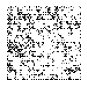

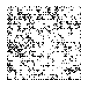

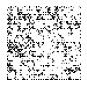

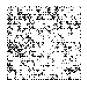

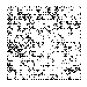

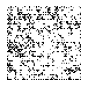

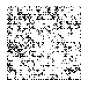

4/4 [==============================] - 0s 11ms/step
epoch 16 loss - discriminator: 2.0386274002248683e-08 / GAN: 17.802553176879883
epoch: 17
batch_number: 0
1/1 [==============================] - 0s 29ms/step
(8, 64, 64, 1)


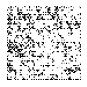

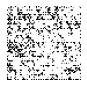

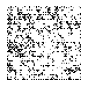

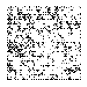

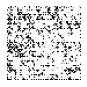

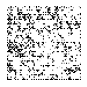

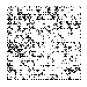

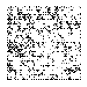

4/4 [==============================] - 0s 10ms/step
batch_number: 100
1/1 [==============================] - 0s 30ms/step
(8, 64, 64, 1)


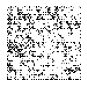

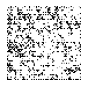

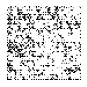

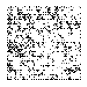

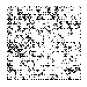

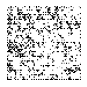

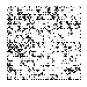

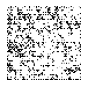

4/4 [==============================] - 0s 12ms/step
batch_number: 200
1/1 [==============================] - 0s 28ms/step
(8, 64, 64, 1)


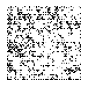

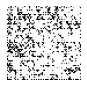

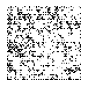

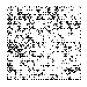

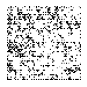

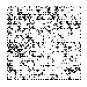

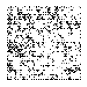

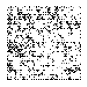

4/4 [==============================] - 0s 15ms/step
batch_number: 300
1/1 [==============================] - 0s 20ms/step
(8, 64, 64, 1)


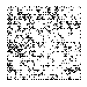

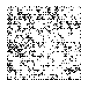

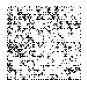

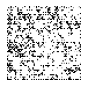

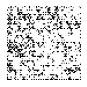

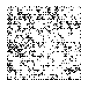

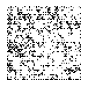

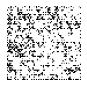

4/4 [==============================] - 0s 11ms/step
epoch 17 loss - discriminator: 1.345621924997431e-08 / GAN: 18.217199325561523
epoch: 18
batch_number: 0
1/1 [==============================] - 0s 34ms/step
(8, 64, 64, 1)


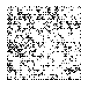

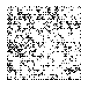

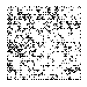

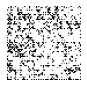

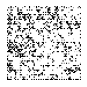

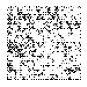

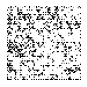

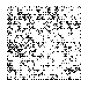

4/4 [==============================] - 0s 11ms/step
batch_number: 100
1/1 [==============================] - 0s 29ms/step
(8, 64, 64, 1)


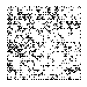

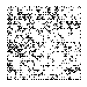

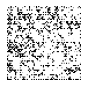

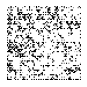

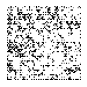

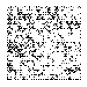

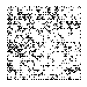

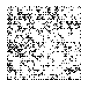

4/4 [==============================] - 0s 11ms/step
batch_number: 200
1/1 [==============================] - 0s 39ms/step
(8, 64, 64, 1)


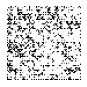

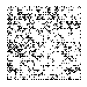

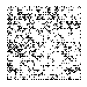

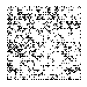

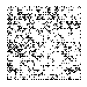

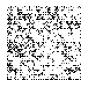

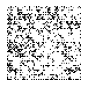

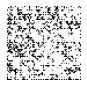

4/4 [==============================] - 0s 15ms/step
batch_number: 300
1/1 [==============================] - 0s 21ms/step
(8, 64, 64, 1)


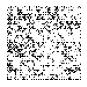

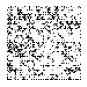

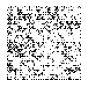

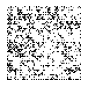

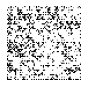

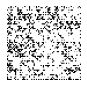

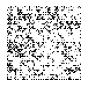

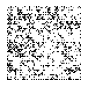

4/4 [==============================] - 0s 12ms/step
epoch 18 loss - discriminator: 9.291206914952e-09 / GAN: 18.698225021362305
epoch: 19
batch_number: 0
1/1 [==============================] - 0s 30ms/step
(8, 64, 64, 1)


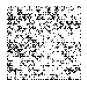

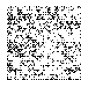

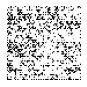

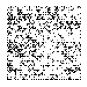

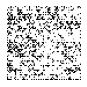

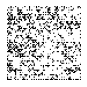

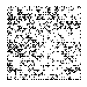

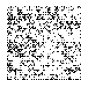

4/4 [==============================] - 0s 11ms/step
batch_number: 100
1/1 [==============================] - 0s 27ms/step
(8, 64, 64, 1)


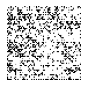

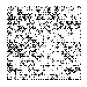

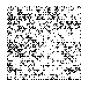

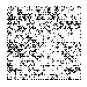

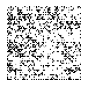

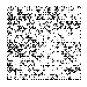

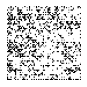

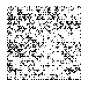

4/4 [==============================] - 0s 11ms/step
batch_number: 200
1/1 [==============================] - 0s 31ms/step
(8, 64, 64, 1)


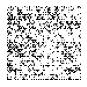

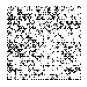

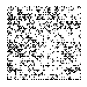

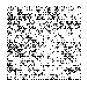

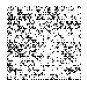

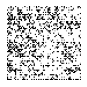

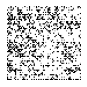

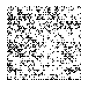

4/4 [==============================] - 0s 13ms/step
batch_number: 300
1/1 [==============================] - 0s 28ms/step
(8, 64, 64, 1)


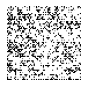

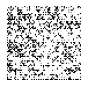

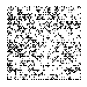

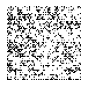

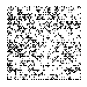

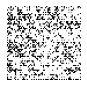

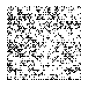

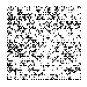

4/4 [==============================] - 0s 14ms/step
epoch 19 loss - discriminator: 6.472199665097378e-09 / GAN: 19.001998901367188
epoch: 20
batch_number: 0
1/1 [==============================] - 0s 28ms/step
(8, 64, 64, 1)


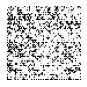

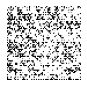

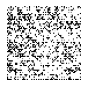

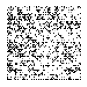

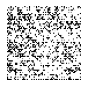

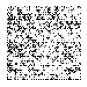

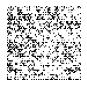

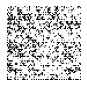

4/4 [==============================] - 0s 11ms/step
batch_number: 100
1/1 [==============================] - 0s 32ms/step
(8, 64, 64, 1)


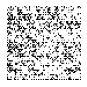

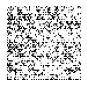

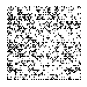

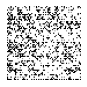

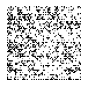

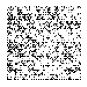

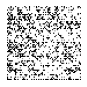

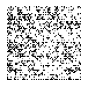

4/4 [==============================] - 0s 11ms/step
batch_number: 200
1/1 [==============================] - 0s 31ms/step
(8, 64, 64, 1)


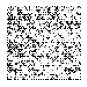

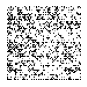

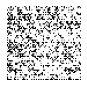

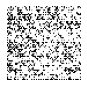

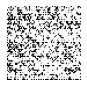

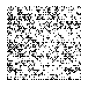

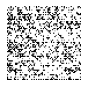

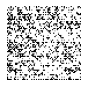

4/4 [==============================] - 0s 15ms/step
batch_number: 300
1/1 [==============================] - 0s 29ms/step
(8, 64, 64, 1)


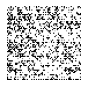

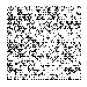

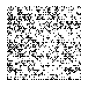

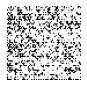

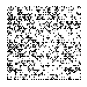

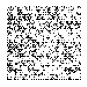

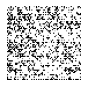

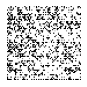

4/4 [==============================] - 0s 12ms/step
epoch 20 loss - discriminator: 3.7187233292712563e-09 / GAN: 19.427724838256836
epoch: 21
batch_number: 0
1/1 [==============================] - 0s 30ms/step
(8, 64, 64, 1)


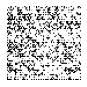

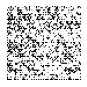

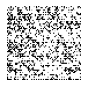

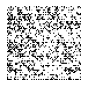

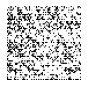

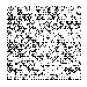

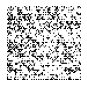

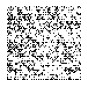

4/4 [==============================] - 0s 14ms/step
batch_number: 100
1/1 [==============================] - 0s 28ms/step
(8, 64, 64, 1)


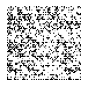

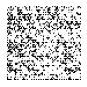

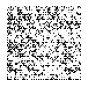

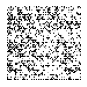

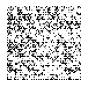

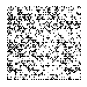

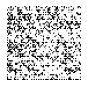

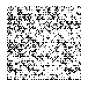

4/4 [==============================] - 0s 15ms/step
batch_number: 200
1/1 [==============================] - 0s 24ms/step
(8, 64, 64, 1)


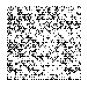

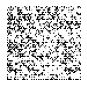

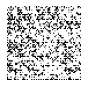

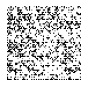

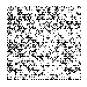

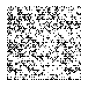

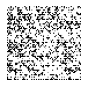

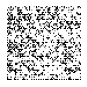

4/4 [==============================] - 0s 11ms/step
batch_number: 300
1/1 [==============================] - 0s 27ms/step
(8, 64, 64, 1)


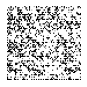

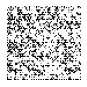

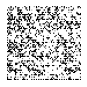

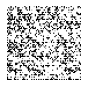

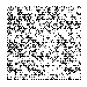

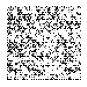

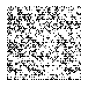

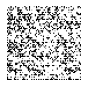

4/4 [==============================] - 0s 15ms/step
epoch 21 loss - discriminator: 2.9135542867209097e-09 / GAN: 19.743736267089844
epoch: 22
batch_number: 0
1/1 [==============================] - 0s 30ms/step
(8, 64, 64, 1)


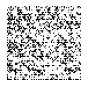

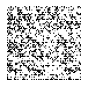

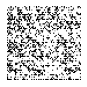

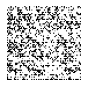

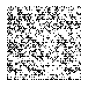

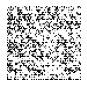

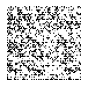

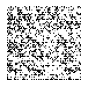

4/4 [==============================] - 0s 12ms/step
batch_number: 100
1/1 [==============================] - 0s 21ms/step
(8, 64, 64, 1)


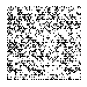

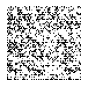

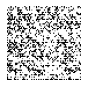

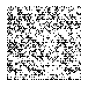

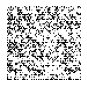

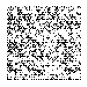

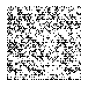

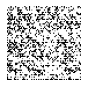

4/4 [==============================] - 0s 12ms/step
batch_number: 200
1/1 [==============================] - 0s 29ms/step
(8, 64, 64, 1)


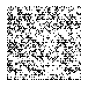

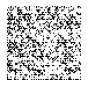

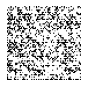

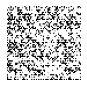

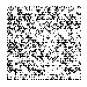

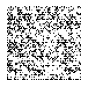

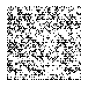

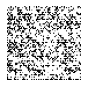

4/4 [==============================] - 0s 12ms/step
batch_number: 300
1/1 [==============================] - 0s 32ms/step
(8, 64, 64, 1)


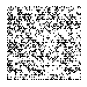

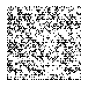

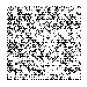

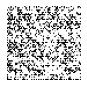

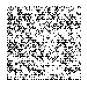

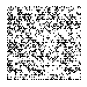

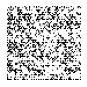

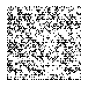

4/4 [==============================] - 0s 13ms/step
epoch 22 loss - discriminator: 1.8389199052393224e-09 / GAN: 20.226173400878906
epoch: 23
batch_number: 0
1/1 [==============================] - 0s 32ms/step
(8, 64, 64, 1)


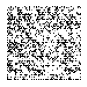

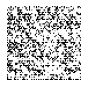

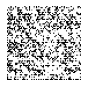

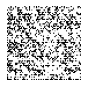

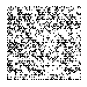

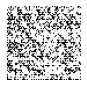

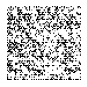

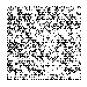

4/4 [==============================] - 0s 12ms/step
batch_number: 100
1/1 [==============================] - 0s 48ms/step
(8, 64, 64, 1)


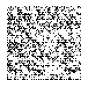

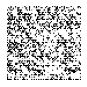

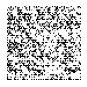

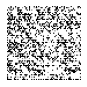

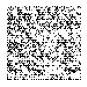

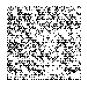

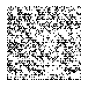

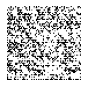

4/4 [==============================] - 0s 11ms/step
batch_number: 200
1/1 [==============================] - 0s 26ms/step
(8, 64, 64, 1)


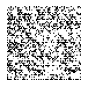

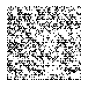

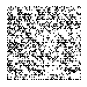

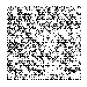

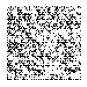

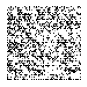

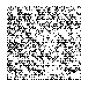

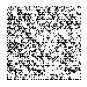

4/4 [==============================] - 0s 11ms/step
batch_number: 300
1/1 [==============================] - 0s 29ms/step
(8, 64, 64, 1)


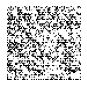

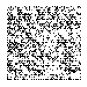

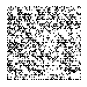

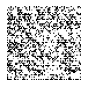

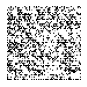

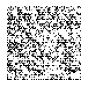

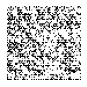

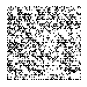

4/4 [==============================] - 0s 15ms/step
epoch 23 loss - discriminator: 1.3814271948575652e-09 / GAN: 20.548818588256836
epoch: 24
batch_number: 0
1/1 [==============================] - 0s 31ms/step
(8, 64, 64, 1)


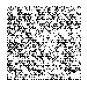

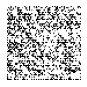

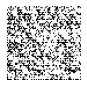

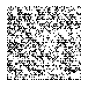

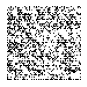

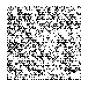

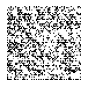

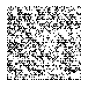

4/4 [==============================] - 0s 11ms/step
batch_number: 100
1/1 [==============================] - 0s 33ms/step
(8, 64, 64, 1)


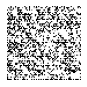

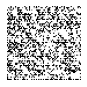

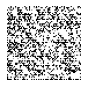

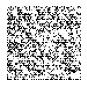

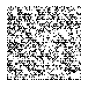

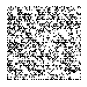

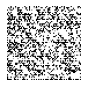

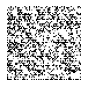

4/4 [==============================] - 0s 13ms/step
batch_number: 200
1/1 [==============================] - 0s 27ms/step
(8, 64, 64, 1)


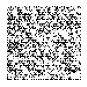

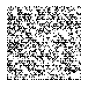

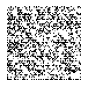

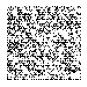

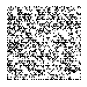

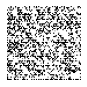

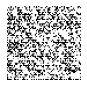

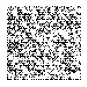

4/4 [==============================] - 0s 11ms/step
batch_number: 300
1/1 [==============================] - 0s 29ms/step
(8, 64, 64, 1)


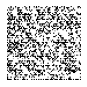

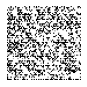

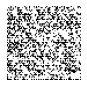

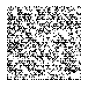

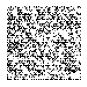

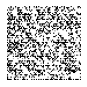

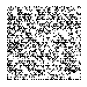

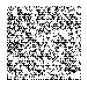

4/4 [==============================] - 0s 22ms/step
epoch 24 loss - discriminator: 8.62483751085108e-10 / GAN: 21.02948760986328
epoch: 25
batch_number: 0
1/1 [==============================] - 0s 26ms/step
(8, 64, 64, 1)


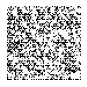

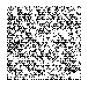

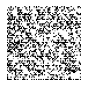

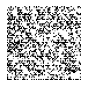

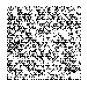

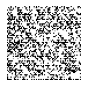

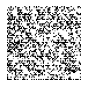

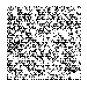

4/4 [==============================] - 0s 11ms/step
batch_number: 100
1/1 [==============================] - 0s 28ms/step
(8, 64, 64, 1)


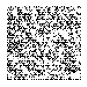

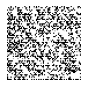

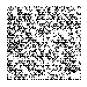

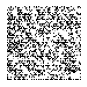

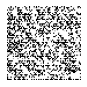

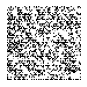

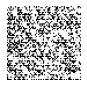

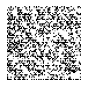

4/4 [==============================] - 0s 12ms/step
batch_number: 200
1/1 [==============================] - 0s 34ms/step
(8, 64, 64, 1)


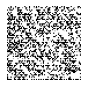

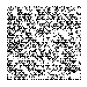

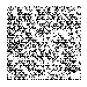

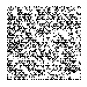

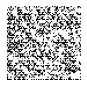

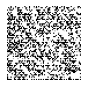

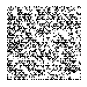

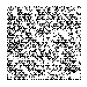

4/4 [==============================] - 0s 11ms/step
batch_number: 300
1/1 [==============================] - 0s 29ms/step
(8, 64, 64, 1)


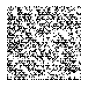

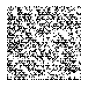

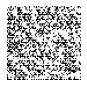

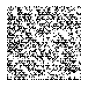

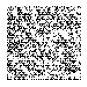

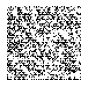

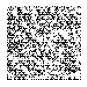

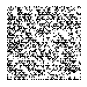

4/4 [==============================] - 0s 11ms/step
epoch 25 loss - discriminator: 6.129955432143674e-10 / GAN: 21.265954971313477
epoch: 26
batch_number: 0
1/1 [==============================] - 0s 38ms/step
(8, 64, 64, 1)


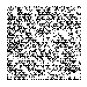

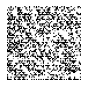

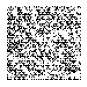

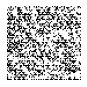

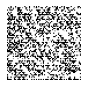

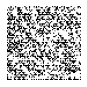

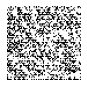

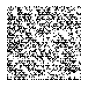

4/4 [==============================] - 0s 11ms/step
batch_number: 100
1/1 [==============================] - 0s 29ms/step
(8, 64, 64, 1)


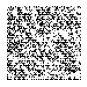

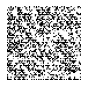

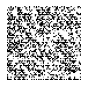

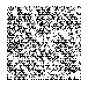

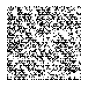

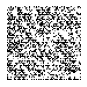

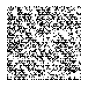

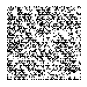

4/4 [==============================] - 0s 11ms/step
batch_number: 200
1/1 [==============================] - 0s 29ms/step
(8, 64, 64, 1)


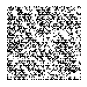

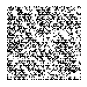

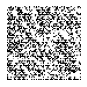

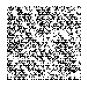

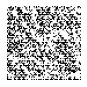

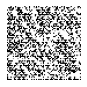

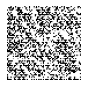

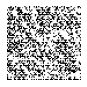

4/4 [==============================] - 0s 13ms/step
batch_number: 300
1/1 [==============================] - 0s 44ms/step
(8, 64, 64, 1)


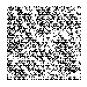

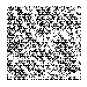

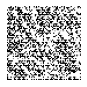

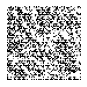

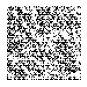

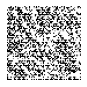

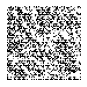

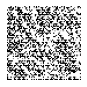

4/4 [==============================] - 0s 11ms/step
epoch 26 loss - discriminator: 4.664939545762081e-10 / GAN: 21.709535598754883
epoch: 27
batch_number: 0
1/1 [==============================] - 0s 26ms/step
(8, 64, 64, 1)


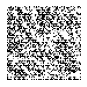

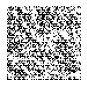

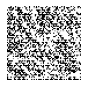

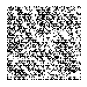

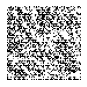

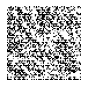

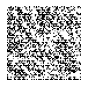

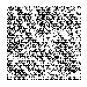

4/4 [==============================] - 0s 15ms/step
batch_number: 100
1/1 [==============================] - 0s 29ms/step
(8, 64, 64, 1)


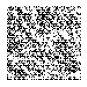

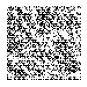

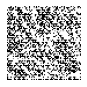

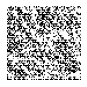

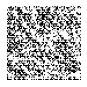

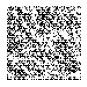

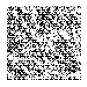

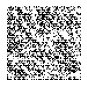

4/4 [==============================] - 0s 13ms/step
batch_number: 200
1/1 [==============================] - 0s 30ms/step
(8, 64, 64, 1)


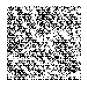

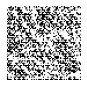

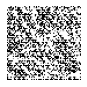

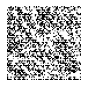

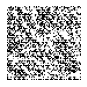

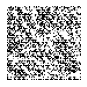

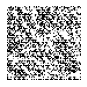

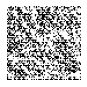

4/4 [==============================] - 0s 12ms/step
batch_number: 300
1/1 [==============================] - 0s 32ms/step
(8, 64, 64, 1)


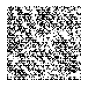

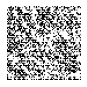

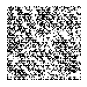

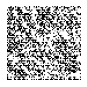

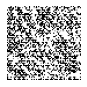

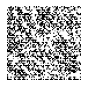

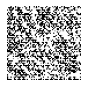

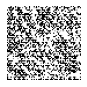

4/4 [==============================] - 0s 11ms/step
epoch 27 loss - discriminator: 3.645103940908001e-10 / GAN: 22.075918197631836
epoch: 28
batch_number: 0
1/1 [==============================] - 0s 29ms/step
(8, 64, 64, 1)


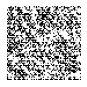

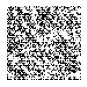

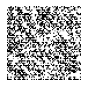

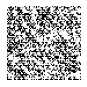

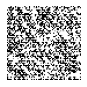

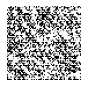

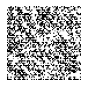

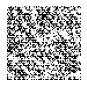

4/4 [==============================] - 0s 12ms/step
batch_number: 100
1/1 [==============================] - 0s 29ms/step
(8, 64, 64, 1)


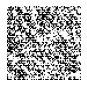

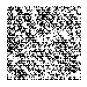

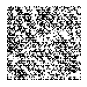

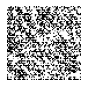

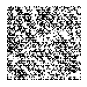

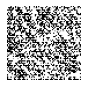

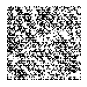

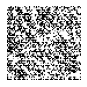

4/4 [==============================] - 0s 11ms/step
batch_number: 200
1/1 [==============================] - 0s 33ms/step
(8, 64, 64, 1)


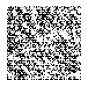

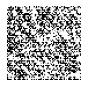

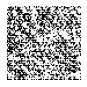

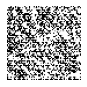

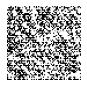

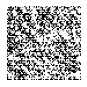

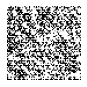

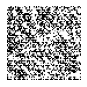

4/4 [==============================] - 0s 10ms/step
batch_number: 300
1/1 [==============================] - 0s 27ms/step
(8, 64, 64, 1)


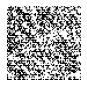

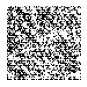

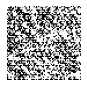

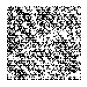

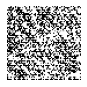

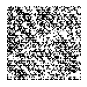

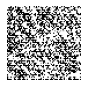

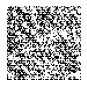

4/4 [==============================] - 0s 11ms/step
epoch 28 loss - discriminator: 2.5628624222839846e-10 / GAN: 22.421476364135742
epoch: 29
batch_number: 0
1/1 [==============================] - 0s 30ms/step
(8, 64, 64, 1)


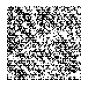

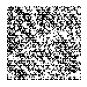

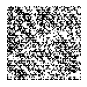

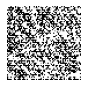

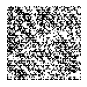

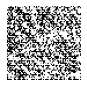

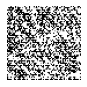

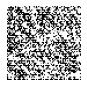

4/4 [==============================] - 0s 12ms/step
batch_number: 100
1/1 [==============================] - 0s 30ms/step
(8, 64, 64, 1)


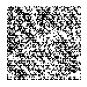

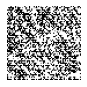

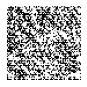

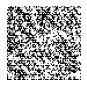

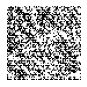

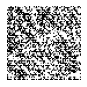

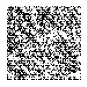

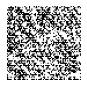

4/4 [==============================] - 0s 11ms/step
batch_number: 200
1/1 [==============================] - 0s 29ms/step
(8, 64, 64, 1)


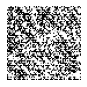

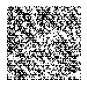

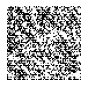

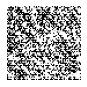

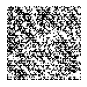

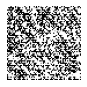

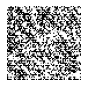

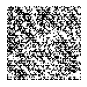

4/4 [==============================] - 0s 11ms/step
batch_number: 300
1/1 [==============================] - 0s 27ms/step
(8, 64, 64, 1)


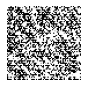

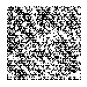

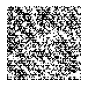

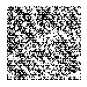

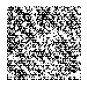

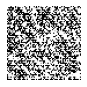

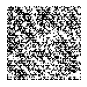

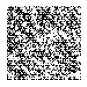

4/4 [==============================] - 0s 11ms/step
epoch 29 loss - discriminator: 1.602220717211722e-10 / GAN: 22.766494750976562
epoch: 30
batch_number: 0
1/1 [==============================] - 0s 32ms/step
(8, 64, 64, 1)


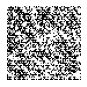

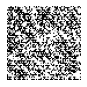

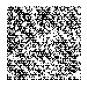

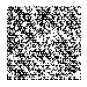

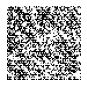

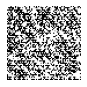

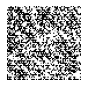

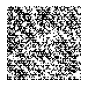

4/4 [==============================] - 0s 12ms/step
batch_number: 100
1/1 [==============================] - 0s 33ms/step
(8, 64, 64, 1)


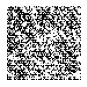

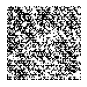

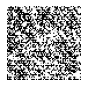

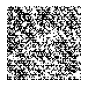

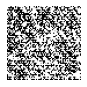

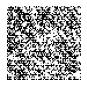

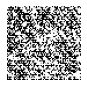

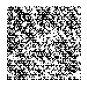

4/4 [==============================] - 0s 11ms/step
batch_number: 200
1/1 [==============================] - 0s 44ms/step
(8, 64, 64, 1)


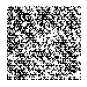

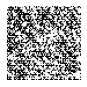

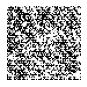

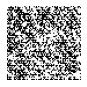

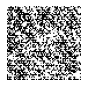

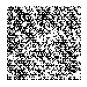

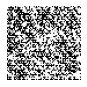

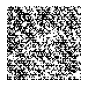

4/4 [==============================] - 0s 11ms/step
batch_number: 300
1/1 [==============================] - 0s 29ms/step
(8, 64, 64, 1)


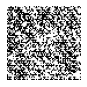

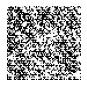

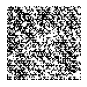

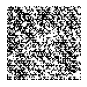

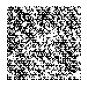

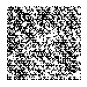

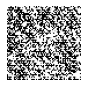

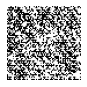

4/4 [==============================] - 0s 13ms/step
epoch 30 loss - discriminator: 1.3425907607889087e-10 / GAN: 22.961692810058594
epoch: 31
batch_number: 0
1/1 [==============================] - 0s 27ms/step
(8, 64, 64, 1)


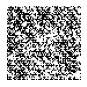

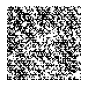

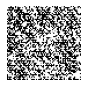

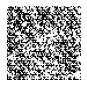

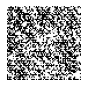

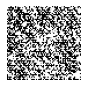

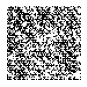

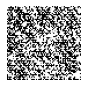

4/4 [==============================] - 0s 11ms/step
batch_number: 100
1/1 [==============================] - 0s 30ms/step
(8, 64, 64, 1)


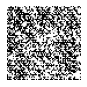

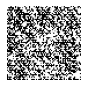

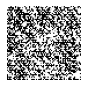

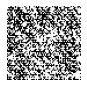

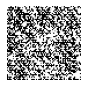

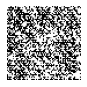

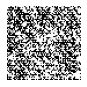

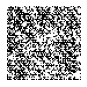

4/4 [==============================] - 0s 16ms/step
batch_number: 200
1/1 [==============================] - 0s 28ms/step
(8, 64, 64, 1)


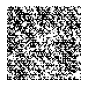

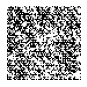

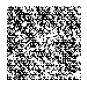

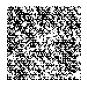

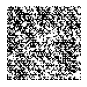

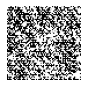

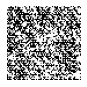

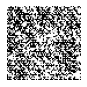

4/4 [==============================] - 0s 11ms/step
batch_number: 300
1/1 [==============================] - 0s 29ms/step
(8, 64, 64, 1)


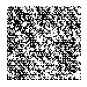

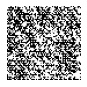

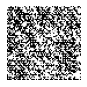

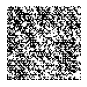

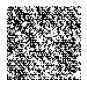

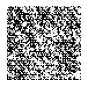

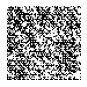

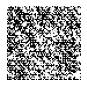

4/4 [==============================] - 0s 11ms/step
epoch 31 loss - discriminator: 8.729844624966177e-11 / GAN: 23.409862518310547
epoch: 32
batch_number: 0
1/1 [==============================] - 0s 31ms/step
(8, 64, 64, 1)


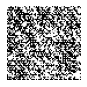

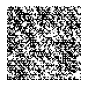

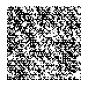

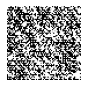

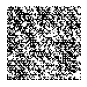

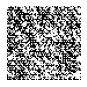

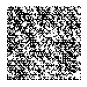

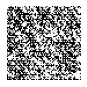

4/4 [==============================] - 0s 11ms/step
batch_number: 100
1/1 [==============================] - 0s 27ms/step
(8, 64, 64, 1)


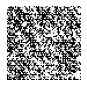

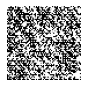

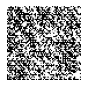

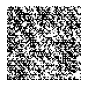

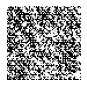

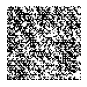

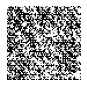

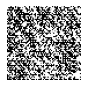

4/4 [==============================] - 0s 11ms/step
batch_number: 200
1/1 [==============================] - 0s 28ms/step
(8, 64, 64, 1)


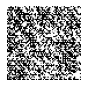

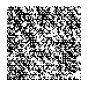

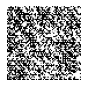

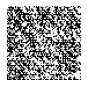

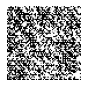

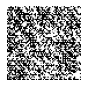

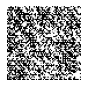

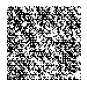

4/4 [==============================] - 0s 11ms/step
batch_number: 300
1/1 [==============================] - 0s 36ms/step
(8, 64, 64, 1)


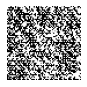

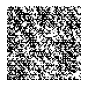

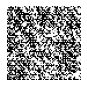

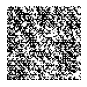

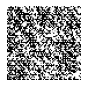

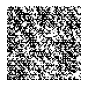

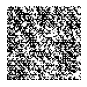

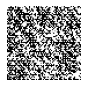

4/4 [==============================] - 0s 11ms/step
epoch 32 loss - discriminator: 6.446762568224074e-11 / GAN: 23.777164459228516
epoch: 33
batch_number: 0
1/1 [==============================] - 0s 28ms/step
(8, 64, 64, 1)


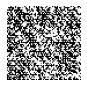

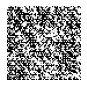

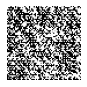

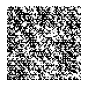

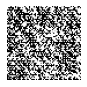

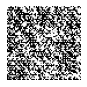

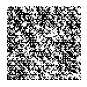

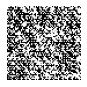

4/4 [==============================] - 0s 11ms/step


In [ ]:
x_data = images

# ValueError: Creating variables on a non-first call to a function decorated with tf.function. 에러 해결
tf.config.run_functions_eagerly(True)

for j in range(100): # epochs=100
    print(f'epoch: {j}')
    for i in range(50000//128): # 50000장 이미지 소비를 1회 epoch으로 해보기 / 128개씩 학습 (batch)
        # 128개 (batch) 학습시키고 경사하강 시킴 -> 반복
        if i % 100 == 0: # 100의 단위 batch 넘버만 출력해주기
            print(f'batch_number: {i}')
            predict_pics()
        # discriminator 트레이닝 -> 실제이미지 / 가짜이미지 넣고 트레이닝
        real_images_128 = x_data[i*128:(i+1)*128] # numpy array # 진짜 사람 이미지
        answer_marked_1 = np.ones(shape=(128, 1)) # np.ones(shape) -> 1로 가득찬 array 만듦 ([1, 1, 1, ... , 1])

        rand_num = np.random.uniform(-1, 1, size=(128, 100)) # discriminator는 랜덤 숫자 받으면 0 or 1 뱉는 모델
        fake_images_128 = generator.predict(rand_num) # 가짜이미지 만들기 위해 generator에다가 랜덤 숫자 넣고 이미지 만들기
        answer_marked_0 = np.zeros(shape=(128, 1))

        # loss갑 출력 원하면 변수에 train_on_batch 값 저장하기 (discriminaotr loss = loss1 + loss2)
        loss1 = discriminator.train_on_batch(real_images_128, answer_marked_1) # 실제사진 트레이닝
        loss2 = discriminator.train_on_batch(fake_images_128, answer_marked_0) # 가짜사진 트레이닝
        # 근데 discriminator를 실제사진들, 가짜사진들'로만' 학습시키면 bias(편향)이 생길 수도 있음...
        # 트레이닝 시킬때 가짜와 진짜를 적절히 셔플하면 도움 될 수도

        # generator (GAN) 트레이닝 -> (GAN에 랜덤숫자, 정답_1 설정한 숫자(128) 집어넣기) -> 가짜 이미지 만들기 (이미지 만들고 정답처리)
        rand_num2 = np.random.uniform(-1, 1, size=(128, 100))
        answer2_marked_1 = np.ones(shape=(128, 1))
        loss3 = GAN.train_on_batch(rand_num2, answer2_marked_1)
    print(f'epoch {j} loss - discriminator: {loss1 + loss2} / GAN: {loss3}')
